# Problem Statement

##### Detailed Time Series Analysis of a Single Stock

Detailed Time Series Analysis of a Single Stock
Data Preparation and Exploration: Clean and preprocess historical price data. Conduct exploratory analysis to document initial observations.
Time Series Decomposition: Apply decomposition techniques to identify trends, seasonality, and residuals.
Stationarity and Testing: Test for stationarity and apply necessary transformations.
Forecasting Model Development: Build and validate forecasting models, explaining your choices, parameter tuning, and validation approach.
Insightful Reporting: Create a detailed report of your analysis, findings, and forecasts.
Submission Instruction:

## Here I'm using random stock which I downloaded from kaggle

# Import Library

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Load data

In [2]:
data = pd.read_csv('INDIAVIX.csv')

# Domain Analysis

- Date: The specific day when the stock prices are recorded.
- Open: The price at which the stock started trading at the beginning of the day.
- High: The highest price at which the stock traded during the day.
- Low: The lowest price at which the stock traded during the day.
- Close: The price at which the stock ended trading at the end of the day.
- Previous: The closing price of the stock from the previous trading day.
- Change: The difference between the closing price of the current day and the previous day's closing price.
- PerChange: The percentage change in the stock's closing price compared to the previous day's closing price.

.

# Basic Check

In [3]:
data.head()

,Date,Open,High,Low,Close,Previous,Change,PerChange
0,02-03-2009,43.19,43.38,41.44,43.17,NaN,0.00,0.0000
1,03-03-2009,43.17,43.90,41.20,43.89,43.17,0.72,0.0167
2,04-03-2009,43.89,43.89,42.16,42.52,43.89,-1.37,-0.0312
3,05-03-2009,42.52,42.71,40.41,41.49,42.52,-1.03,-0.0242
4,06-03-2009,41.49,41.49,37.57,38.16,41.49,-3.33,-0.0803


In [4]:
data.tail()

,Date,Open,High,Low,Close,Previous,Change,PerChange
2764,04-05-2020,33.9875,43.920,33.9875,43.6700,33.9875,9.68,0.2849
2765,05-05-2020,43.6700,43.865,38.1475,43.6075,43.6700,-0.06,-0.0014
2766,06-05-2020,43.6075,43.630,40.1975,41.2475,43.6075,-2.36,-0.0541
2767,07-05-2020,41.2475,41.715,39.6575,39.9300,41.2475,-1.32,-0.0319
2768,08-05-2020,39.9300,39.930,36.5475,38.4075,39.9300,-1.52,-0.0381


In [5]:
data.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Previous', 'Change',
       'PerChange'],
      dtype='object')

In [6]:
data.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Previous     float64
Change       float64
PerChange    float64
dtype: object

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2769 entries, 0 to 2768
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       2769 non-null   object 
 1   Open       2769 non-null   float64
 2   High       2769 non-null   float64
 3   Low        2769 non-null   float64
 4   Close      2769 non-null   float64
 5   Previous   2768 non-null   float64
 6   Change     2769 non-null   float64
 7   PerChange  2769 non-null   float64
dtypes: float64(7), object(1)
memory usage: 173.2+ KB


In [8]:
data.ndim

2

In [9]:
data.size

22152

In [10]:
data.shape

(2769, 8)

In [11]:
data.size

22152

In [12]:
data.describe()

,Open,High,Low,Close,Previous,Change,PerChange
count,2769.000000,2769.000000,2769.000000,2769.000000,2768.000000,2769.000000,2769.000000
mean,19.637037,20.550775,18.297726,19.765841,19.759440,-0.000968,0.001347
std,7.917076,8.439532,7.696670,8.063060,8.056558,1.269633,0.052728
min,10.447500,10.807500,8.755000,10.447500,10.447500,-12.470000,-0.339200
25%,14.760000,15.255000,13.462500,14.760000,14.760000,-0.480000,-0.026900
50%,17.247500,17.990000,16.057500,17.275000,17.273750,-0.040000,-0.002200
75%,21.740000,22.860000,20.590000,22.040000,22.021250,0.460000,0.025500
max,83.607500,86.635000,75.972500,83.607500,83.607500,11.620000,0.643600


In [13]:
data.Change.value_counts()

 0.00    29
-0.05    24
-0.06    23
-0.16    22
-0.37    22
         ..
 3.65     1
 1.87     1
 1.43     1
 2.74     1
-2.36     1
Name: Change, Length: 532, dtype: int64

# Data Preprocessing

In [14]:
data.corr()

,Open,High,Low,Close,Previous,Change,PerChange
Open,1.000000,0.990275,0.988581,0.986091,0.997433,-0.075535,-0.060378
High,0.990275,1.000000,0.986459,0.995568,0.991444,0.022515,0.033643
Low,0.988581,0.986459,1.000000,0.987226,0.989219,-0.016383,-0.009337
Close,0.986091,0.995568,0.987226,1.000000,0.987555,0.075098,0.079549
Previous,0.997433,0.991444,0.989219,0.987555,1.000000,-0.082402,-0.064952
Change,-0.075535,0.022515,-0.016383,0.075098,-0.082402,1.000000,0.917827
PerChange,-0.060378,0.033643,-0.009337,0.079549,-0.064952,0.917827,1.000000


In [15]:
data.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Previous     1
Change       0
PerChange    0
dtype: int64

In [16]:
# Checking mean median and mode
print(data.mean())
print(data.median())
print(data.mode())

Open         19.637037
High         20.550775
Low          18.297726
Close        19.765841
Previous     19.759440
Change       -0.000968
PerChange     0.001347
dtype: float64
Open         17.24750
High         17.99000
Low          16.05750
Close        17.27500
Previous     17.27375
Change       -0.04000
PerChange    -0.00220
dtype: float64
            Date   Open   High    Low  Close  Previous  Change  PerChange
0     01-01-2013  16.82  16.91  16.17  14.25     14.25     0.0        0.0
1     01-01-2014    NaN  21.22    NaN  14.51     14.51     NaN        NaN
2     01-01-2015    NaN    NaN    NaN  15.55     15.55     NaN        NaN
3     01-01-2016    NaN    NaN    NaN  16.16     16.16     NaN        NaN
4     01-01-2018    NaN    NaN    NaN  16.36     16.36     NaN        NaN
...          ...    ...    ...    ...    ...       ...     ...        ...
2764  31-12-2013    NaN    NaN    NaN    NaN       NaN     NaN        NaN
2765  31-12-2014    NaN    NaN    NaN    NaN       NaN     NaN 

In [17]:
 # Converting 'Date' is the column containing date objects

# Convert 'Date' column to datetime with the correct format
data["Date"] = pd.to_datetime(data["Date"], format='%d-%m-%Y')

# Extract day, month, and year into separate columns
data['Day'] = data['Date'].dt.day
data['Month'] = data['Date'].dt.month
data['Year'] = data['Date'].dt.year

In [18]:
data = data.dropna(subset=['Previous'])

In [19]:
data.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Previous     0
Change       0
PerChange    0
Day          0
Month        0
Year         0
dtype: int64

In [20]:
data.dtypes

Date         datetime64[ns]
Open                float64
High                float64
Low                 float64
Close               float64
Previous            float64
Change              float64
PerChange           float64
Day                   int64
Month                 int64
Year                  int64
dtype: object

In [21]:
data.duplicated().count()

2768

# Exploratory Data Analysis (EDA)

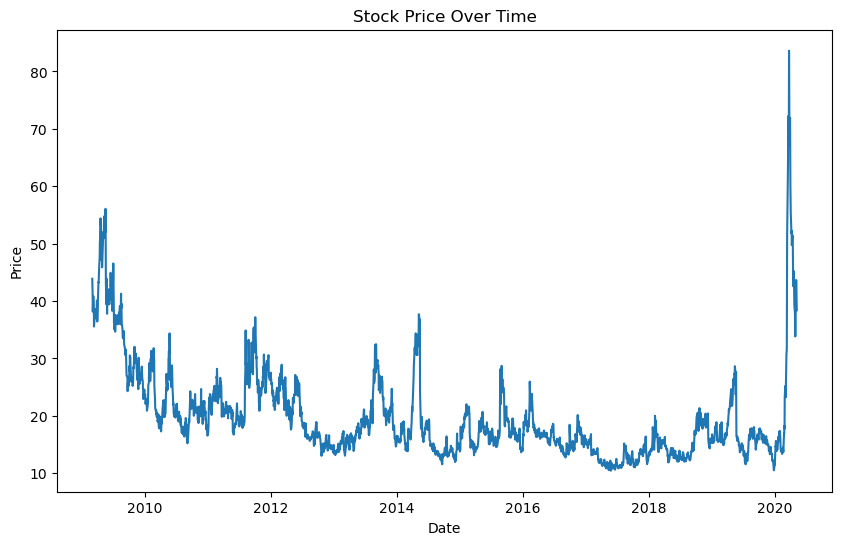

In [23]:
#Line Plot
plt.figure(figsize=(10, 6))
plt.plot(data['Date'], data['Close'])
plt.title('Stock Price Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.show()

Here the x-axis represents the dates and the y-axis represents the stock's closing prices. The line connects the closing price of the stock on each date,

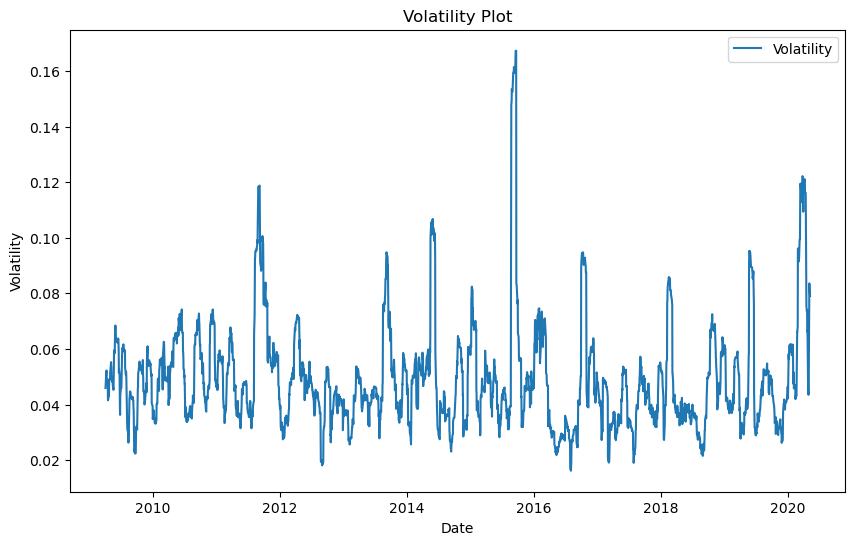

In [24]:
plt.figure(figsize=(10, 6))
plt.plot(data['Date'], data['Close'].pct_change().rolling(window=20).std(), label='Volatility')
plt.title('Volatility Plot')
plt.xlabel('Date')
plt.ylabel('Volatility')
plt.legend()
plt.show()

Here we can see the changes date by date with volatility
- This plot is useful for understanding how volatilty, as measured by the rolling standard deviation of price changes, fluctuates over the observed period. 
- It helps us to identfying periods of high and low volatility, which can be crucial for risk assessment and trading strategies in financial analysis

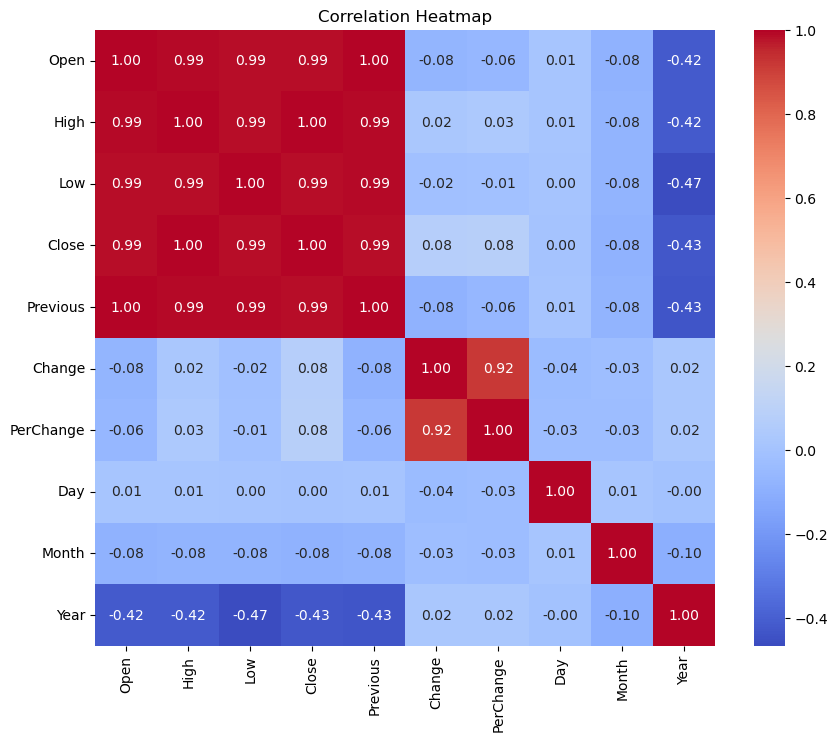

In [25]:
# The heatMap plot
corr_matrix = data.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

 Here we can see the how correlate variable using heatmap

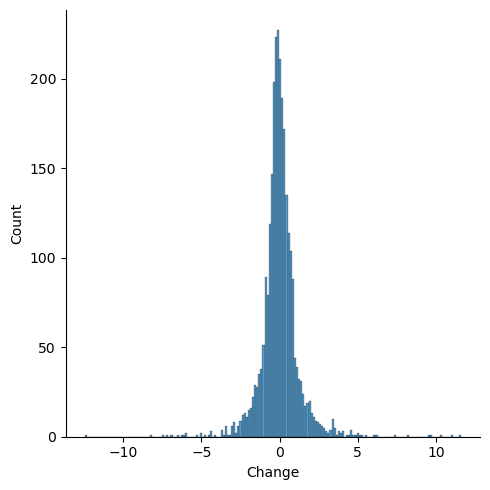

In [26]:
sns.displot(x=data['Change'])

In [27]:
# library mostly use for univariant analysis
import sweetviz as sv
my_report = sv.analyze(data)
my_report.show_html('myreport.html') # Default arguments will generate to "SWEETVIZ_REPORT.html"

                                             |                                             | [  0%]   00:00 ->…

Report myreport.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.




    we can apply the sweetviz library to perform exploratory data analysis (EDA) efficiently.
    Quick Data Overview: sweetviz helps you get a quick and comprehensive overview of your dataset. It generates visualizations and statistics that summarize data, making it easier to understand its characteristics.
    Data Comparison: You can use sweetviz to compare two datasets, such as a training dataset and a test dataset, to identify any differences or discrepancies.
    Feature Analysis: It provides insights into individual features (columns) by visualizing their distributions and statistics. This is helpful for understanding the data within each feature.
    Target Analysis: If we'll working on a classification or regression problem, sweetviz can analyze the relationship between features and the target variable, helping you identify important predictors.



<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
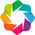

Imported v0.1.720. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (2769, 8)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
  Printing upto 30 columns max in each category:
    Numeric Columns : ['Open', 'High', 'Low', 'Close', 'Previous', 'Change', 'PerChange']
    Integer-Categorical Columns: []
    String-Categorical Columns: []
    Factor-Categorical Columns: []
    String-Boolean Columns: []
    Numeric-Boolean Columns: []
    Discrete String Columns

Saving distplots_nums in HTML format
Saving violinplots in HTML format                                                                                      
Saving heatmaps in HTML format
Time to run AutoViz (in seconds) = 15


In [28]:
from autoviz.AutoViz_Class import AutoViz_Class
AV=AutoViz_Class()
data=AV.AutoViz(filename="INDIAVIX.csv",verbose=2,chart_format='html')



    AutoViz is another Python library for automated and quick exploratory data analysis (EDA) and visualization. Like Sweetviz, AutoViz aims to simplify the process of understanding and visualizing your dataset.
    Automated Visualization: AutoViz automates the process of generating a wide range of visualizations for dataset without requiring you to specify each plot manually. This saves time and effort.
    Quick Insights: It provides a rapid way to gain insights into data by creating visualizations of key features, distributions, and relationships between variables.
    Feature Selection: AutoViz can help you identify important features or columns in your dataset that may have a significant impact on your target variable.
    Visualization Variety: It generates various types of plots, including histograms, scatter plots, bar charts, and more, to cover different aspects of your data.



## Final Insights by EDA

#### We can consider the stock price is being low or high in day or week or month or year
 #### We can consider the stock price is being Close with Percentage of Changes
 #### We can consider the stock price compair with open and close with date
 #### We can consider the stock price how it's relate to previous or change with date
#### We can conside significant volatility in stock prices, as indicated by the large daily changes and percentage changes.

- Here I'm not pointing the specific accure percentage the any changes or high or low Becouse every stock changed in milisecond 

# Feture Engineering

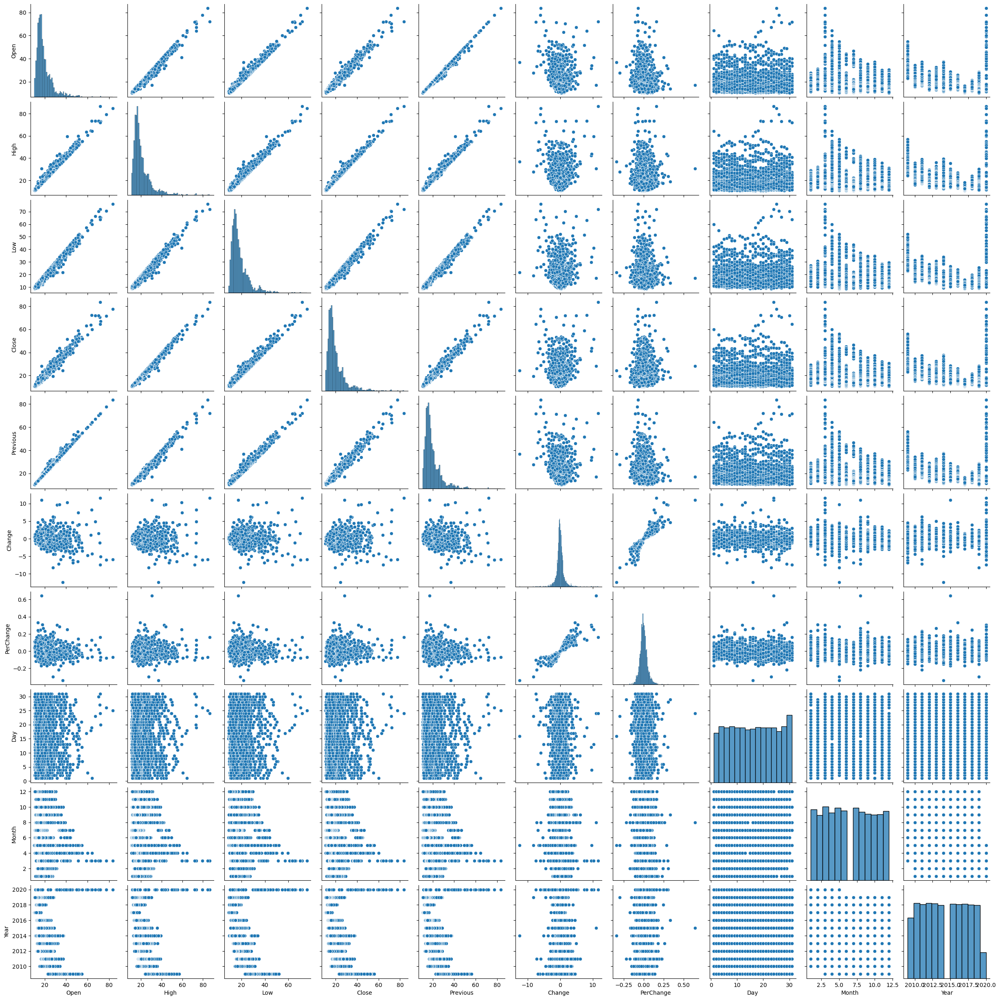

In [21]:
sns.pairplot(data)

In [22]:
data.corr()

,Open,High,Low,Close,Previous,Change,PerChange,Day,Month,Year
Open,1.000000,0.990260,0.988544,0.986048,0.997433,-0.075657,-0.060447,0.010405,-0.083872,-0.417774
High,0.990260,1.000000,0.986435,0.995562,0.991444,0.022544,0.033712,0.013808,-0.079195,-0.420020
Low,0.988544,0.986435,1.000000,0.987188,0.989219,-0.016410,-0.009325,0.004472,-0.080034,-0.466068
Close,0.986048,0.995562,0.987188,1.000000,0.987555,0.075212,0.079697,0.002888,-0.083554,-0.428829
Previous,0.997433,0.991444,0.989219,0.987555,1.000000,-0.082402,-0.064952,0.008936,-0.079257,-0.432214
Change,-0.075657,0.022544,-0.016410,0.075212,-0.082402,1.000000,0.917827,-0.038338,-0.027874,0.023674
PerChange,-0.060447,0.033712,-0.009325,0.079697,-0.064952,0.917827,1.000000,-0.031267,-0.033844,0.022789
Day,0.010405,0.013808,0.004472,0.002888,0.008936,-0.038338,-0.031267,1.000000,0.014205,-0.002469
Month,-0.083872,-0.079195,-0.080034,-0.083554,-0.079257,-0.027874,-0.033844,0.014205,1.000000,-0.103915
Year,-0.417774,-0.420020,-0.466068,-0.428829,-0.432214,0.023674,0.022789,-0.002469,-0.103915,1.000000


In [23]:
# Here I'm creating seprate colomns for MA_5 and STD_5 who's based on close of mean and standered daviation
data['MA_5'] = data['Close'].rolling(window=5).mean()
data['STD_5'] = data['Close'].rolling(window=5).std()

# Stationarity

 

   - Stationarity means that the statistical properties of a time series (or rather the process generating it) do not change over time.
   - Stationarity is important because many useful analytical tools and statistical tests and models rely on it.



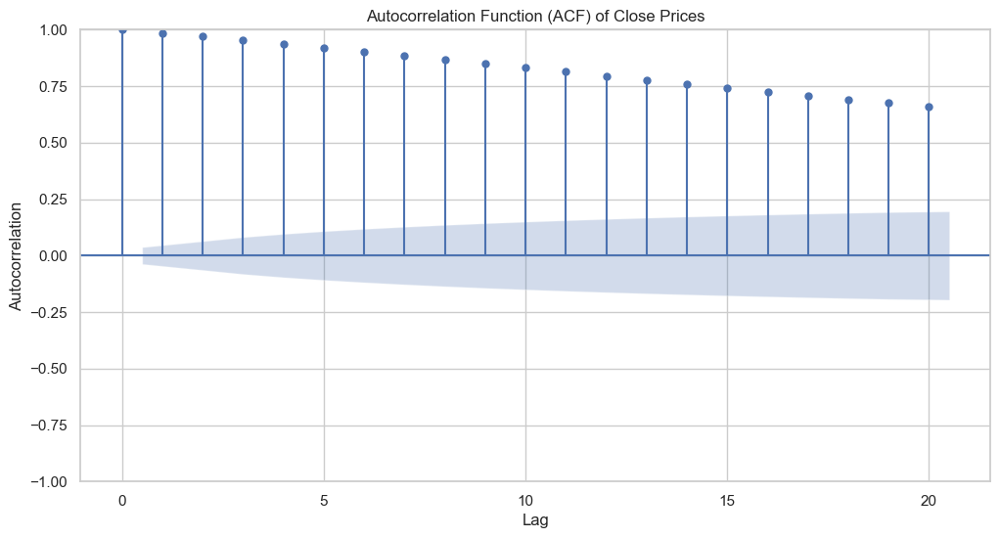

In [29]:
## Plotting the autocorrelation function
from statsmodels.graphics.tsaplots import plot_acf
# Set up the figure and axes using seaborn style
plt.figure(figsize=(12, 6))
sns.set(style='whitegrid')
# Plot the ACF using plot_acf from statsmodels
plot_acf(data['Close'], lags=20, alpha=0.05, ax=plt.gca())
 
plt.title('Autocorrelation Function (ACF) of Close Prices')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
 
plt.show()

In [ ]:
# ADfuller Test to check stationarity

In [30]:
from statsmodels.tsa.stattools import adfuller

# Assuming 'data' is your DataFrame with stock data, and 'Close' is the column of interest
dftest = adfuller(data['Close'], autolag='AIC')

# Extract and print results
print("Results of Augmented Dickey-Fuller Test:")
print("ADF Statistic: %f" % dftest[0])
print("P-value: %f" % dftest[1])
print("Number of Lags Used: %d" % dftest[2])
print("Number of Observations Used: %d" % dftest[3])
print("Critical Values:")
for key, val in dftest[4].items():
    print("\t%s: %.3f" % (key, val))

# Interpret the results
if dftest[1] <= 0.05:
    print("Conclusion: Reject the null hypothesis.")
    print("The data is stationary.")
else:
    print("Conclusion: Fail to reject the null hypothesis.")
    print("The data is non-stationary.")

Results of Augmented Dickey-Fuller Test:
ADF Statistic: -3.951116
P-value: 0.001689
Number of Lags Used: 23
Number of Observations Used: 2744
Critical Values:
	1%: -3.433
	5%: -2.863
	10%: -2.567
Conclusion: Reject the null hypothesis.
The data is stationary.


#### Here Don't need to stationary becouse the data is stationary.
#### if the data got non-stationary then we need to perform. 

#### But I'll try to perform
### after performing the accuracy/prediction wasn't satisfiying therfore I'm using the our clean data =data

In [35]:
data1=data.diff(periods=1)

In [36]:
data1=data1.iloc[1:] #null value discarded
data1

,Date,Open,High,Low,Close,Previous,Change,PerChange,Day,Month,Year,MA_5,STD_5
2,1 days,0.7200,-0.0100,0.9600,-1.3700,0.7200,-2.09,-0.0479,1.0,0.0,0.0,NaN,NaN
3,1 days,-1.3700,-1.1800,-1.7500,-1.0300,-1.3700,0.34,0.0070,1.0,0.0,0.0,NaN,NaN
4,1 days,-1.0300,-1.2200,-2.8400,-3.3300,-1.0300,-2.30,-0.0561,1.0,0.0,0.0,NaN,NaN
5,3 days,-3.3300,-0.3500,0.5900,2.7100,-3.3300,6.04,0.1513,3.0,0.0,0.0,NaN,NaN
6,3 days,2.7100,-0.2700,0.3400,-1.6000,2.7100,-4.31,-0.1101,3.0,0.0,0.0,-0.9240,-0.390524
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2764,4 days,0.1500,9.6675,1.4525,9.6825,0.1500,9.53,0.2805,-26.0,1.0,0.0,0.9105,1.705093
2765,1 days,9.6825,-0.0550,4.1600,-0.0625,9.6825,-9.74,-0.2863,1.0,0.0,0.0,1.1130,0.994840
2766,1 days,-0.0625,-0.2350,2.0500,-2.3600,-0.0625,-2.30,-0.0527,1.0,0.0,0.0,1.1785,-0.110858
2767,1 days,-2.3600,-1.9150,-0.5400,-1.3175,-2.3600,1.04,0.0222,1.0,0.0,0.0,1.2185,-1.018854


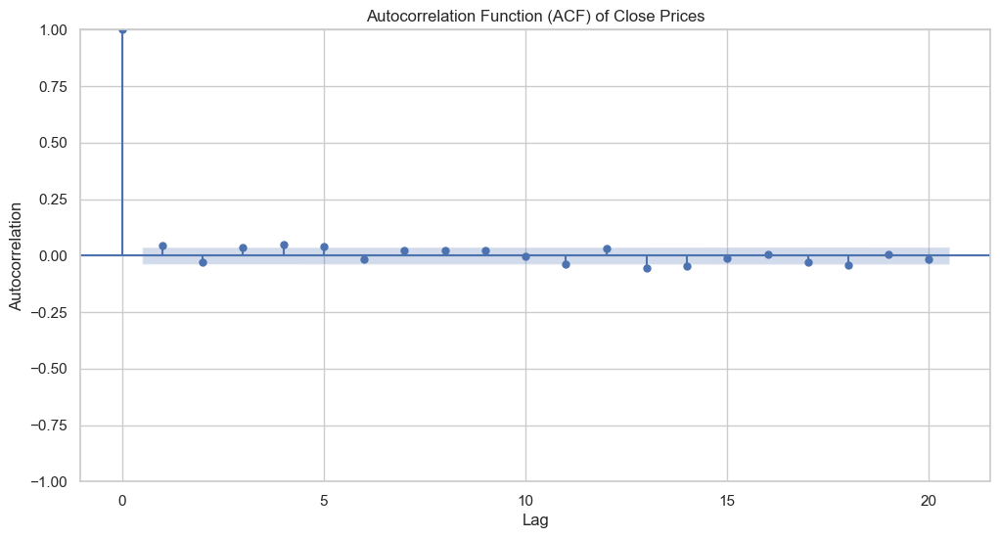

In [41]:
## Plotting the autocorrelation function
 
# Set up the figure and axes using seaborn style
plt.figure(figsize=(12, 6))
sns.set(style='whitegrid')
# Plot the ACF using plot_acf from statsmodels
plot_acf(data1['Close'], lags=20, alpha=0.05, ax=plt.gca())
 
plt.title('Autocorrelation Function (ACF) of Close Prices')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
 
plt.show()

In [44]:
 data2=data1.diff(periods=1) # differencing applied to data1

In [45]:
data2=data2.iloc[1:] # integrated to the order of 2

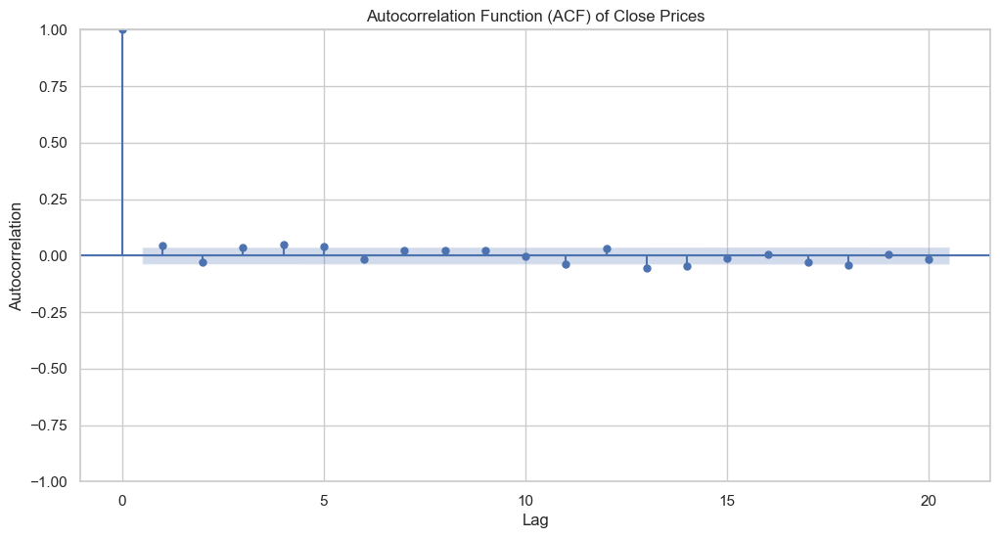

In [47]:
## Plotting the autocorrelation function
 
# Set up the figure and axes using seaborn style
plt.figure(figsize=(12, 6))
sns.set(style='whitegrid')
# Plot the ACF using plot_acf from statsmodels
plot_acf(data1['Close'], lags=20, alpha=0.05, ax=plt.gca())
 
plt.title('Autocorrelation Function (ACF) of Close Prices')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
 
plt.show()

In [48]:
data2.shape#shape of the data rows and columns

(2766, 13)

# Model Building

In [72]:
# Select the Close price column
close_data = data['Close']

# Split the data into training and testing sets
train_size = int(len(data) * 0.8)
train, test = close_data[:train_size], close_data[train_size:]

 

In [73]:
train.info()#info about datatype and null value

<class 'pandas.core.series.Series'>
Int64Index: 2214 entries, 1 to 2214
Series name: Close
Non-Null Count  Dtype  
--------------  -----  
2214 non-null   float64
dtypes: float64(1)
memory usage: 34.6 KB


# Autoregressive model

In [74]:
## Applying autoregressive model
#from statsmodels.tsa.ar_model import AR
##from statsmodels.tsa.ar_model import AutoReg

from statsmodels.tsa.ar_model import ar_select_order, AutoReg
import warnings
warnings.filterwarnings('ignore')

In [75]:
# Use ar_select_order to find the best lags
mod = ar_select_order(close_data, maxlag=15, glob=True)
best_lags = mod.ar_lags

print("Best lags:", best_lags)

Best lags: [1, 10]


In [76]:
# fitting Model
ar_model = AutoReg(train, lags=best_lags)
ar_model_fit = ar_model.fit()

# Summary of the model
print(ar_model_fit.summary())

                            AutoReg Model Results                             
Dep. Variable:                  Close   No. Observations:                 2214
Model:             Restr. AutoReg(10)   Log Likelihood               -3488.602
Method:               Conditional MLE   S.D. of innovations              1.178
Date:                Fri, 14 Jun 2024   AIC                           6985.204
Time:                        03:50:55   BIC                           7007.996
Sample:                            10   HQIC                          6993.532
                                 2214                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2556      0.075      3.412      0.001       0.109       0.402
Close.L1       0.9699      0.008    116.043      0.000       0.954       0.986
Close.L10      0.0167      0.008      2.032      0.0

In [77]:
# Forecast
start = len(train)
end = len(train) + len(test) - 1
ar_predictions = ar_model_fit.predict(start=start, end=end, dynamic=False)

# Ensure no NaN values in predictions
ar_predictions = ar_predictions.dropna()
test = test[:len(ar_predictions)]

In [82]:
ar_predictions

2214    15.280565
2215    15.333819
2216    15.399409
2217    15.493413
2218    15.575671
          ...    
2763    19.118306
2764    19.118379
2765    19.118452
2766    19.118523
2767    19.118593
Length: 554, dtype: float64

RMSE: 10.136630170962777


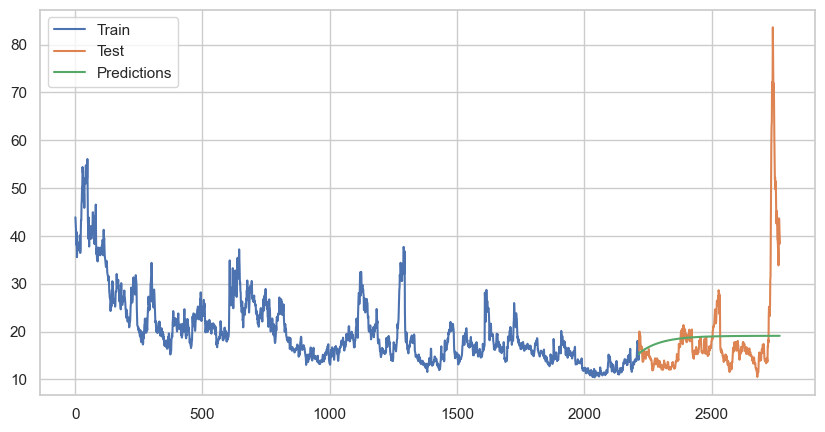

In [78]:
# Evaluate the model
from sklearn.metrics import mean_squared_error

rmse = mean_squared_error(test, ar_predictions, squared=False)
print(f'RMSE: {rmse}')

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(ar_predictions.index, ar_predictions, label='Predictions')
plt.legend()
plt.show()

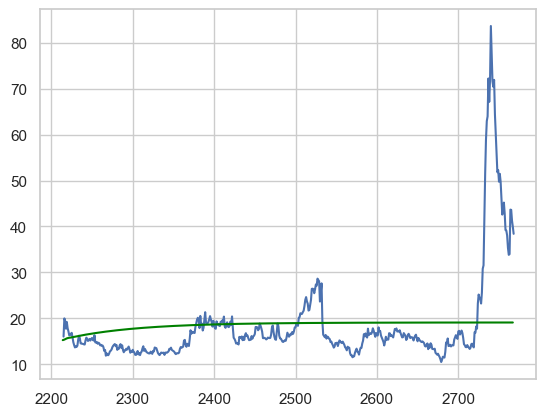

In [79]:
# Plot
plt.plot(test)
plt.plot(ar_predictions,color='green') #graph of test vs prediction

# ARIMA Model 

In [80]:
## importing the library
from statsmodels.tsa.arima.model import ARIMA

In [81]:
# Determine the optimal order for ARIMA model (using the best AR lags for p, and setting d=1 and q=0)
p = len(best_lags)
d = 1
q = 0

# Split the data into training and testing sets
train_size = int(len(close_data) * 0.8)
train, test = close_data[:train_size], close_data[train_size:]

# Fit the ARIMA model
arima_model= ARIMA(train, order=(p, d, q))
arima_model_fit = arima_model.fit()

# Summary of the model
print(arima_model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                 2214
Model:                 ARIMA(2, 1, 0)   Log Likelihood               -3519.079
Date:                Fri, 14 Jun 2024   AIC                           7044.158
Time:                        03:51:13   BIC                           7061.265
Sample:                             0   HQIC                          7050.407
                               - 2214                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0322      0.011     -2.882      0.004      -0.054      -0.010
ar.L2         -0.0623      0.014     -4.548      0.000      -0.089      -0.035
sigma2         1.4084      0.016     86.859      0.0

In [83]:
# Forecast
start = len(train)
end = len(train) + len(test) - 1
arima_predictions = arima_model_fit.predict(start=start, end=end, dynamic=False)

# Ensure no NaN values in predictions
arima_predictions = arima_predictions.dropna()
test = test[:len(arima_predictions)]



In [84]:
arima_predictions

2214    15.326809
2215    15.253108
2216    15.250694
2217    15.255367
2218    15.255367
          ...    
2763    15.255101
2764    15.255101
2765    15.255101
2766    15.255101
2767    15.255101
Name: predicted_mean, Length: 554, dtype: float64

RMSE: 10.757668363751822


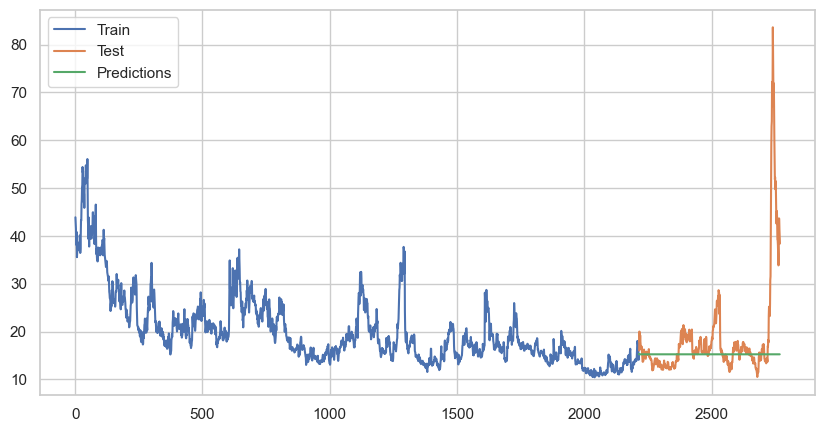

In [85]:
# Evaluate the model
from sklearn.metrics import mean_squared_error

rmse = mean_squared_error(test, arima_predictions, squared=False)
print(f'RMSE: {rmse}')

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(arima_predictions.index, arima_predictions, label='Predictions')
plt.legend()
plt.show()

In [86]:
 # Ensure no NaN values in predictions
ar_predictions = ar_predictions.dropna()
test_ar = test[:len(ar_predictions)]

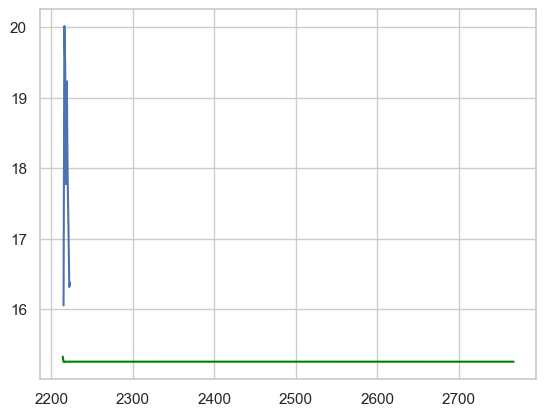

In [87]:
# Comparision of actual vs predicted for 9 values
plt.plot(test[:9])
plt.plot(arima_predictions,color='green')#line plot for prediction

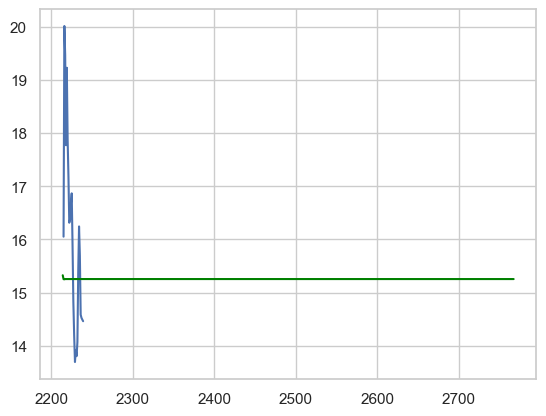

In [88]:
# Comparision of actual vs predicted for 25 values
plt.plot(test[:25])
plt.plot(arima_predictions,color='green') #line plot for prediction

# Model Evaluation ARIMA

In [89]:
import numpy as np
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse

# Define the accuracy metrics function
def forecast_accuracy(forecast, actual):
    mse = np.mean((forecast - actual)**2)        # Mean Squared Error (MSE)
    mae = np.mean(np.abs(forecast - actual))     # Mean Absolute Error (MAE)
    rmse = np.mean((forecast - actual)**2)**.5   # Root Mean Squared Error (RMSE)
    
    return {'mse': mse, 'mae': mae, 'rmse': rmse}

# Assuming forecast25 and test1 are your forecasted and actual values respectively
forecast25 = arima_predictions
test1 = test
 

In [90]:
# Calculate and print accuracy metrics
accuracy_metrics = forecast_accuracy(forecast25, test1)
print("Accuracy metrics:", accuracy_metrics)

# Calculate and print RMSE using statsmodels
print("RMSE (statsmodels):", rmse(test1, forecast25))

# Calculate and print MSE using sklearn
print("MSE (sklearn):", mean_squared_error(test1, forecast25))

Accuracy metrics: {'mse': 114.96755895589818, 'mae': 4.591014924243197, 'rmse': 10.72229261659549}
RMSE (statsmodels): 10.757668363751822
MSE (sklearn): 115.72742862446681


In [91]:
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse

# Calculate root mean squared error
print(rmse(test1, forecast25))

# Calculate mean squared error
mean_squared_error(test1, forecast25)

10.757668363751822


115.72742862446681

In [92]:
# Ensure no NaN values in predictions
arima_predictions = arima_predictions.dropna()
test_arima = test[:len(arima_predictions)]

# Conclusion

Here we can able to see the what was actual value and predicted value using graph

### Calculate Accuracy Metrics

In [94]:
# Calculate accuracy metrics for AR model
ar_accuracy = forecast_accuracy(ar_predictions, test_ar)
print("The AR model accuracy metrics:", ar_accuracy)

# Calculate accuracy metrics for ARIMA model
arima_accuracy = forecast_accuracy(arima_predictions, test_arima)
print("The ARIMA model accuracy metrics:", arima_accuracy)

# Additional metrics using sklearn and statsmodels
print("The AR model RMSE (statsmodels):", rmse(test_ar, ar_predictions))
print("The AR model MSE (sklearn):", mean_squared_error(test_ar, ar_predictions))

print("The ARIMA model RMSE (statsmodels):", rmse(test_arima, arima_predictions))
print("The ARIMA model MSE (sklearn):", mean_squared_error(test_arima, arima_predictions))

The AR model accuracy metrics: {'mse': 102.29256679864773, 'mae': 5.529926168061879, 'rmse': 10.113978781797385}
The ARIMA model accuracy metrics: {'mse': 114.96755895589818, 'mae': 4.591014924243197, 'rmse': 10.72229261659549}
The AR model RMSE (statsmodels): 10.136630170962777
The AR model MSE (sklearn): 102.75127122287286
The ARIMA model RMSE (statsmodels): 10.757668363751822
The ARIMA model MSE (sklearn): 115.72742862446681


### Calculate Accuracy Metrics

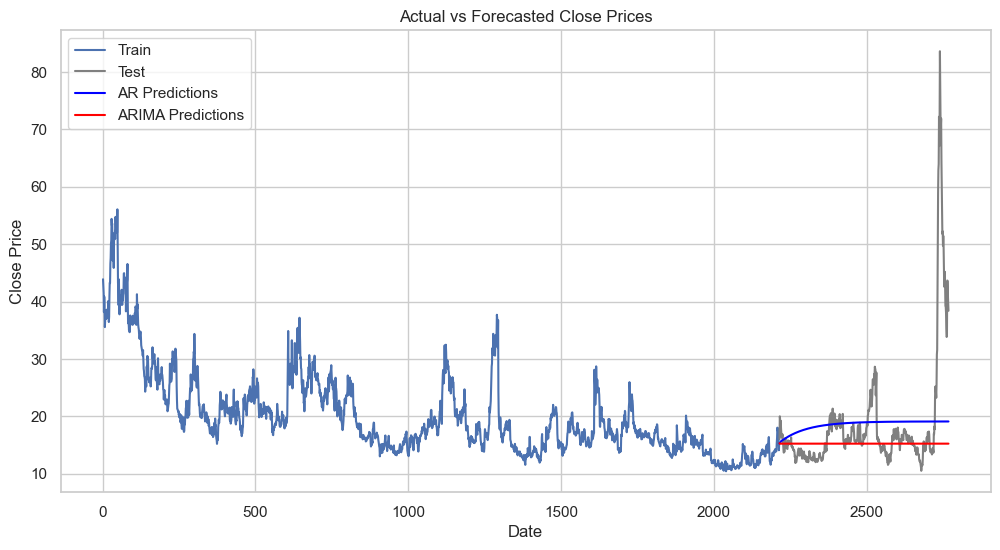

In [95]:
plt.figure(figsize=(12, 6))

# Plot the actual values
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test', color='gray')

# Plot the AR model forecasts
plt.plot(test_ar.index, ar_predictions, label='AR Predictions', color='blue')

# Plot the ARIMA model forecasts
plt.plot(test_arima.index, arima_predictions, label='ARIMA Predictions', color='red')

plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('Actual vs Forecasted Close Prices')
plt.legend()
plt.show()

#### Here we can able to see the what was actual value and predicted value using graph